# Experimentation with other Edge Detection Techniques
### J. Cristiano
The purpose of this notebook is to experiment with Edge detection operators and supporting algorithms that I may have overlooked. 

Currently, The [best that I have to offer](./plantCV_notebook.ipynb) is based on the 3x3 Sobel operator that calculates the first derivative of the image. 

But after [reading more](https://en.wikipedia.org/wiki/Canny_edge_detector) it occurs to me that I might have made premature conclusions on what is the "cutting edge" of edge detection based image segmentation.

This notebook hopes to be a more comprehensive approach.

### Experimental Design
I'll use the 2 images that I developed my algorithm on as well as a third image that performed really poorly.

In [1]:
#import block
%matplotlib inline
import matplotlib.pyplot as plt
import cv2
import numpy as np
from plantcv import plantcv as pcv
import os
os.chdir("./braceroot_plantcv/")


In [2]:
image_list = [file for file in os.listdir() if file.endswith(('.png', '.jpg', '.jpeg'))]
# print(image_list)
images = []
for filename in image_list:
    img = cv2.imread(filename)
    images.append(img)

In [3]:
#Images need to be converted to RGB from BGR
images = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB) for image in images]
#The 1st & 3rd images need to be rotated
images[0] = cv2.rotate(images[0], cv2.ROTATE_180)
images[2] = cv2.rotate(images[2], cv2.ROTATE_90_CLOCKWISE)

First, lets make a function to display the images before and after the algorithm 

In [4]:
def plot_images(input_images, output_images):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    
    for i, (input_img, output_img) in enumerate(zip(input_images, output_images)):
        axes[0, i].imshow(input_img, cmap='copper')
        axes[0, i].set_title('Input')
        axes[0, i].axis('off')
        
        axes[1, i].imshow(output_img, cmap='copper')
        axes[1, i].set_title('Output')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

### Canny Edge Detection

This [algorithm designed in 1986](https://ieeexplore.ieee.org/document/4767851) is used widely in edge detection problems.

Its also already implemented in libraries such as openCV and plantCV

I'll implement from scratch first to explain the process


#### Step 1: Filtering Gaussian Noise
Gaussian noise is described as signal noise with a probability density function that resembles a gaussian (normal) distribution. In images, this is commonly caused by electrical circuit noise in the camera sensor, a problem that isn't going away anytime soon.

OpenCV calls this process Gaussian Blur 

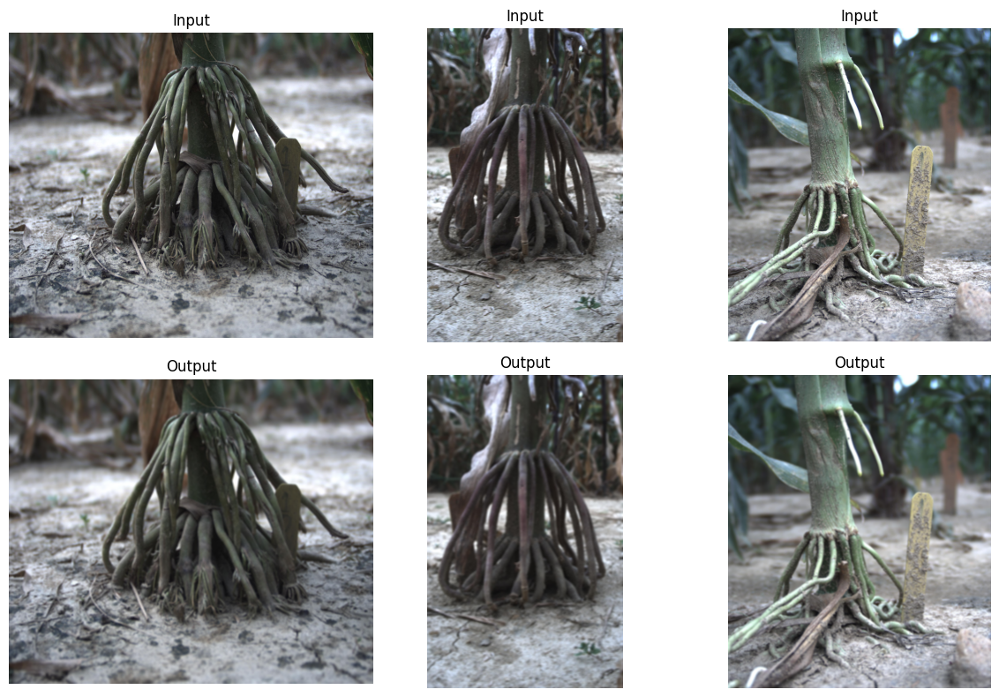

In [5]:
filtered_images = []
for img in images:
    filtered_images.append(cv2.GaussianBlur(img, (15, 15), 10))
    #The size of the kernel is set to (5,5) and the standard deviation is set to 0 (calculated automatically)
    #The larger the kernel size, the more noise will be removed, but the more detail will be lost
    #The larger the standard deviation, the wider the area of influence of the kernel, and so more smoothing will occur 
plot_images(images, filtered_images)

#### Step 2: Calculating the Image Intensity Gradient
This is essentially the 2D differentiation of the image. We will also calculate the direction the edges follow. There are multiple edge operators that have comparable, yet different results. 

In [6]:
def gradient_and_direction(img, edge_operator):
    #Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #Apply the edge operator
    partial_x = cv2.filter2D(gray, -1, edge_operator)
    partial_y = cv2.filter2D(gray, -1, edge_operator.T)
    #Calculate the gradient
    gradient = np.sqrt(partial_x**2 + partial_y**2)
    #Calculate the direction
    direction = np.arctan2(partial_x, partial_y)
    return gradient, direction

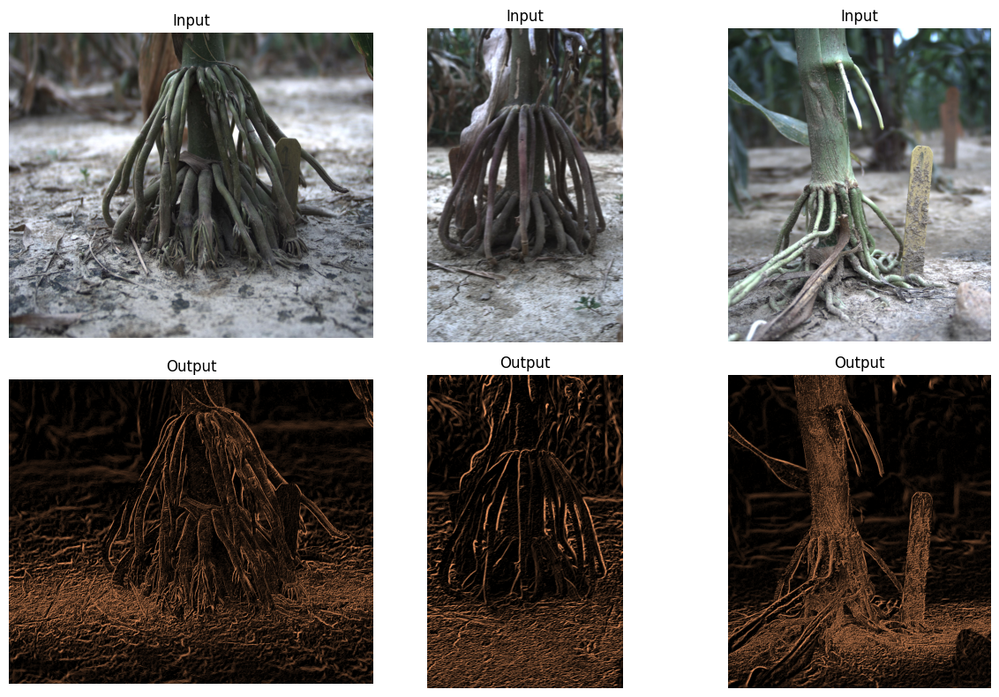

In [7]:
sobel_op = np.array([[-3,0,3],
                     [-10,0,10],
                     [-3,0,3]])/32
gradients = []
directions = []
for img in images:
    grad, dir = gradient_and_direction(img, sobel_op)
    gradients.append(grad)
    directions.append(dir)
plot_images(images, gradients)

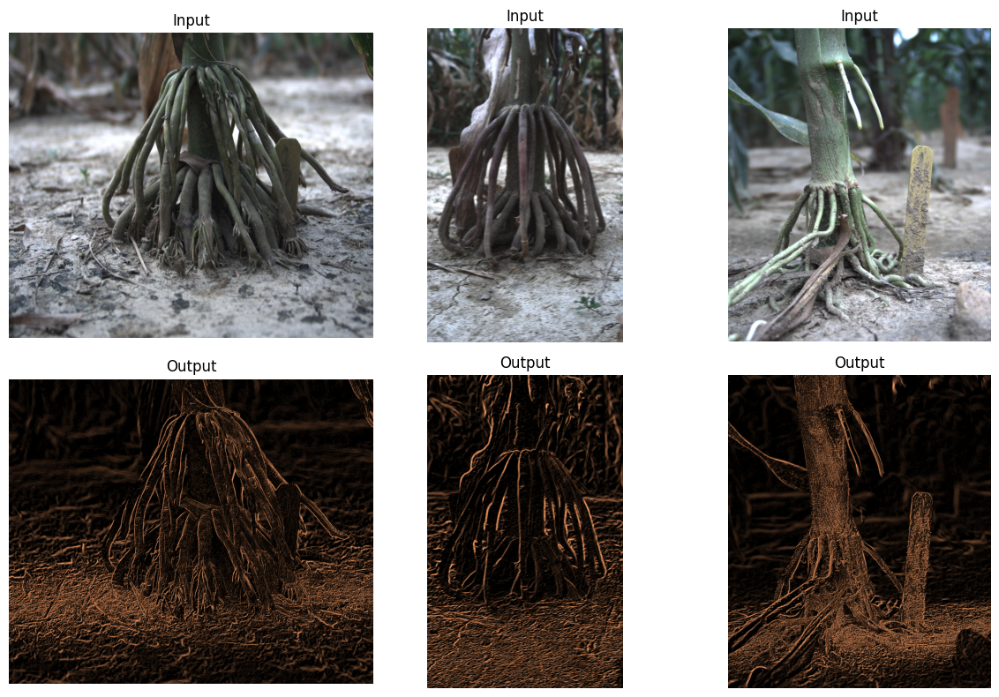

In [8]:
prewitt_op =  np.array([[-1,0,1],
                        [-1,0,1],
                        [-1,0,1]])/6
gradients = []
directions = []
for img in images:
    grad, dir = gradient_and_direction(img, prewitt_op)
    gradients.append(grad)
    directions.append(dir)
plot_images(images, gradients)

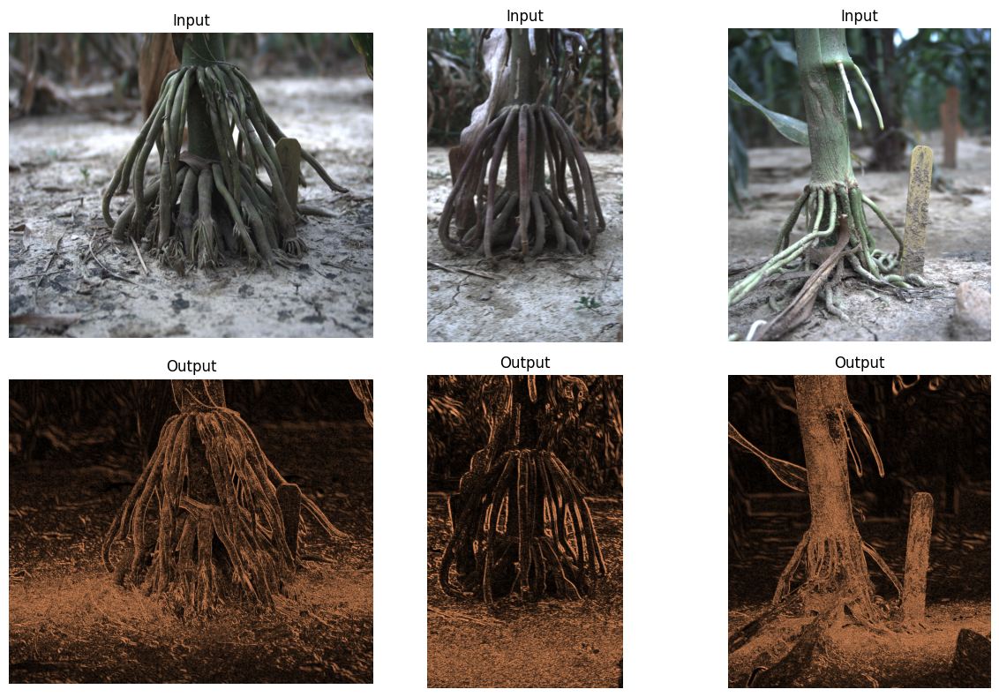

In [9]:
robert_op = np.array([[0,1],
                      [-1,0]])
gradients = []
directions = []
for img in images:
    grad, dir = gradient_and_direction(img, robert_op)
    gradients.append(grad)
    directions.append(dir)
plot_images(images, gradients)

#### Step 3: Edge Thinning 
This is done using non max supression. This code was written by co-pilot, which copied from [here](https://towardsdatascience.com/canny-edge-detection-step-by-step-in-python-computer-vision-b49c3a2d8123)

In [10]:
def non_max_suppression(img,D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

In [11]:
threshd_imgs = []
for operator in [sobel_op, prewitt_op, robert_op]:
    for img in images:
        grad, dir = gradient_and_direction(img, operator)
        grad = non_max_suppression(grad, dir)
        threshd_imgs.append(grad)

`threshd_imgs` is now a list of 9 imgs, 3 for each operator, so we'll have 3 swatches of results.  

sobel_op


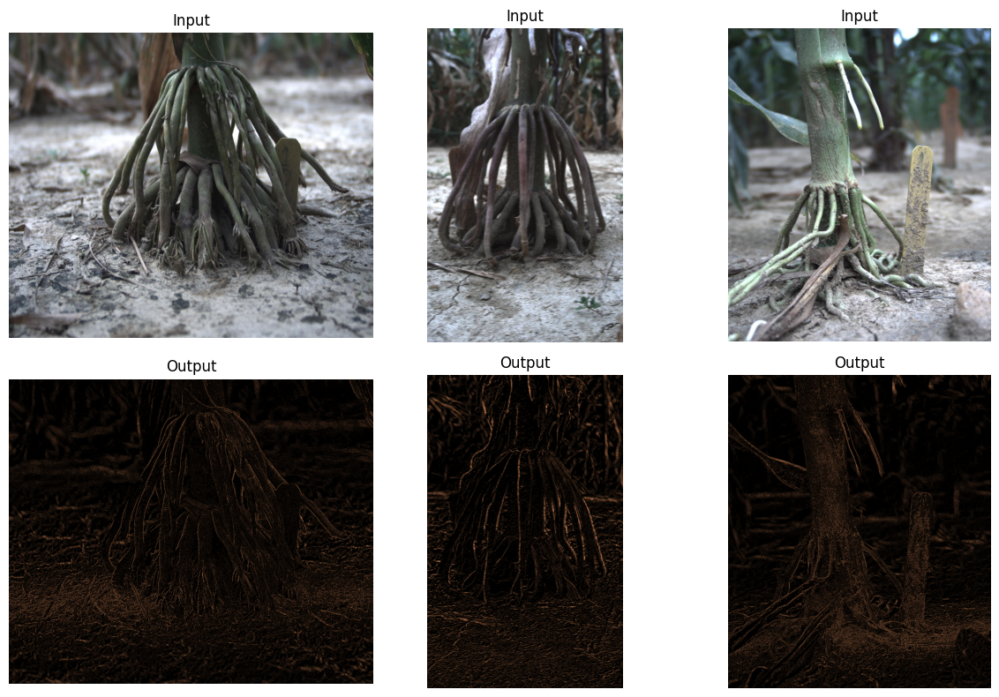

prewitt_op


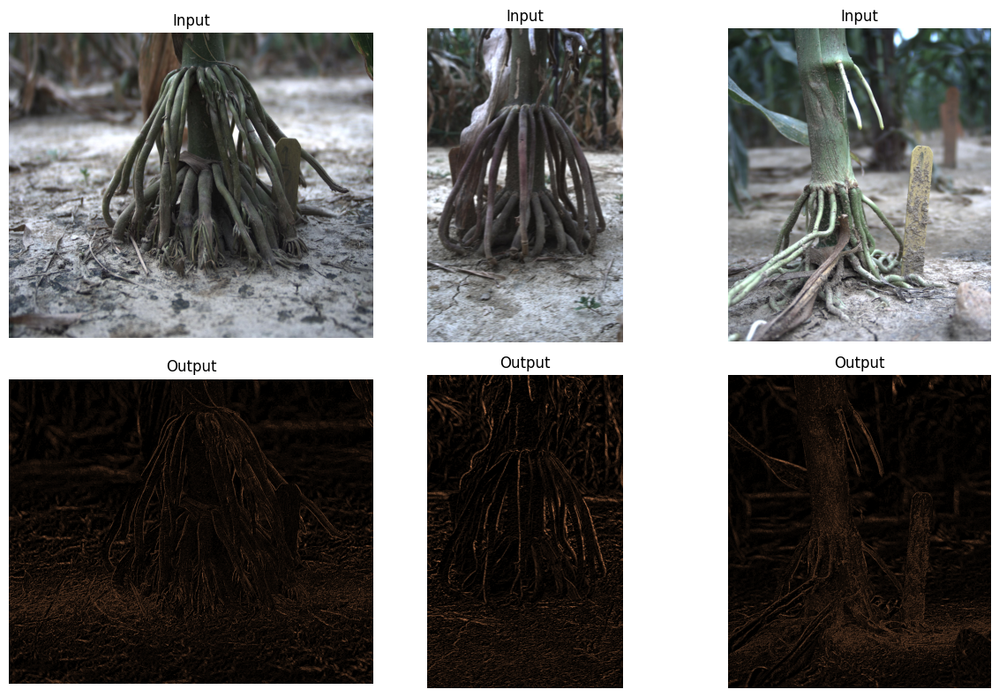

robert_op


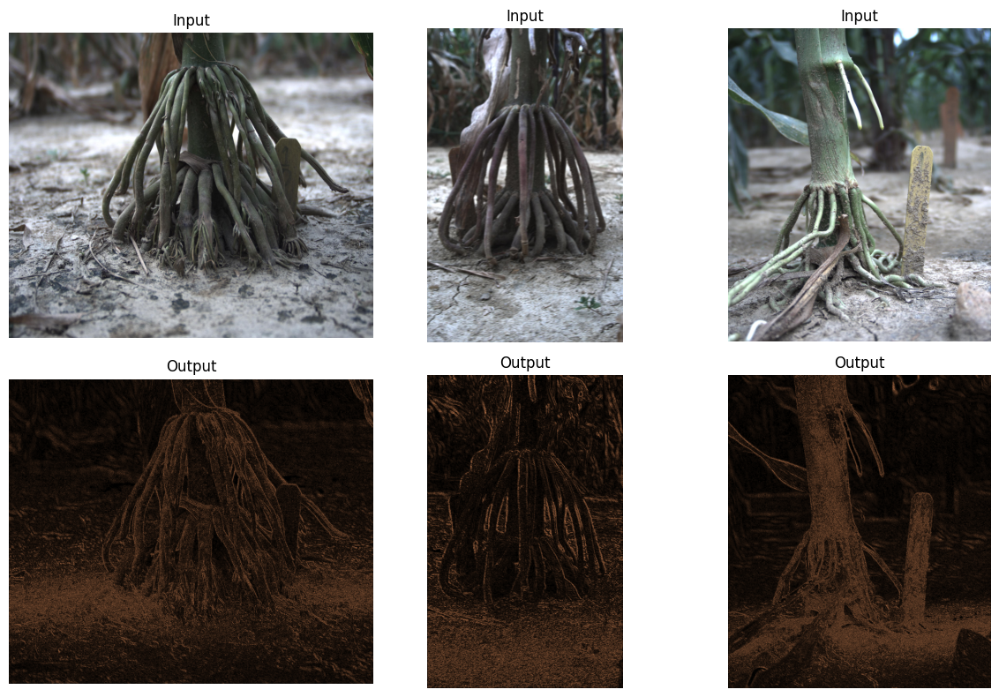

In [12]:
for i in range(0, len(threshd_imgs), 3):
    print(["sobel_op", "prewitt_op", "robert_op"][i//3])
    plot_images(images, threshd_imgs[i:i+3])
    

#### Step 4: Double Threshold
Some edge pixels remain that are caused by noise and color variation. So we filter out edge pixels with a weak gradient value and preserve edge pixels with a high gradient value. We'll use a double threshold.

Thresholds have to be empirically determined... :(

In [13]:
def double_threshold(image, low_threshold, high_threshold):
    mask = np.zeros_like(image)
    # Set pixels above the high threshold to 255
    mask[image >= high_threshold] = 255
    # Find pixels between the low and high thresholds
    weak_pixels = (image >= low_threshold) & (image < high_threshold)
    
    # Set weak pixels to 127
    mask[weak_pixels] = 200
    
    return mask

sobel_op


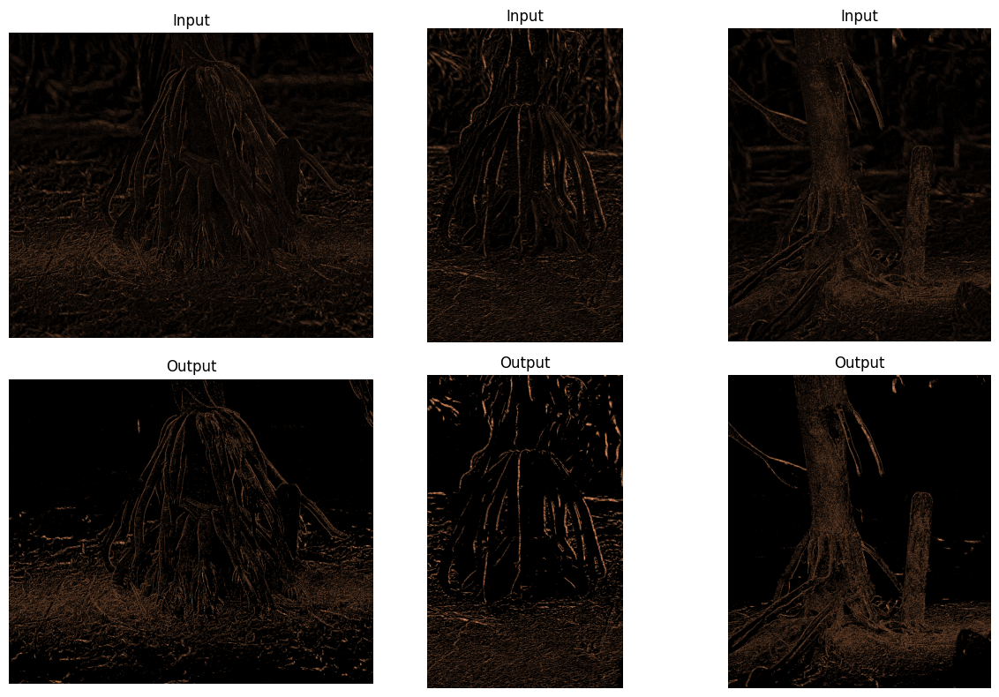

prewitt_op


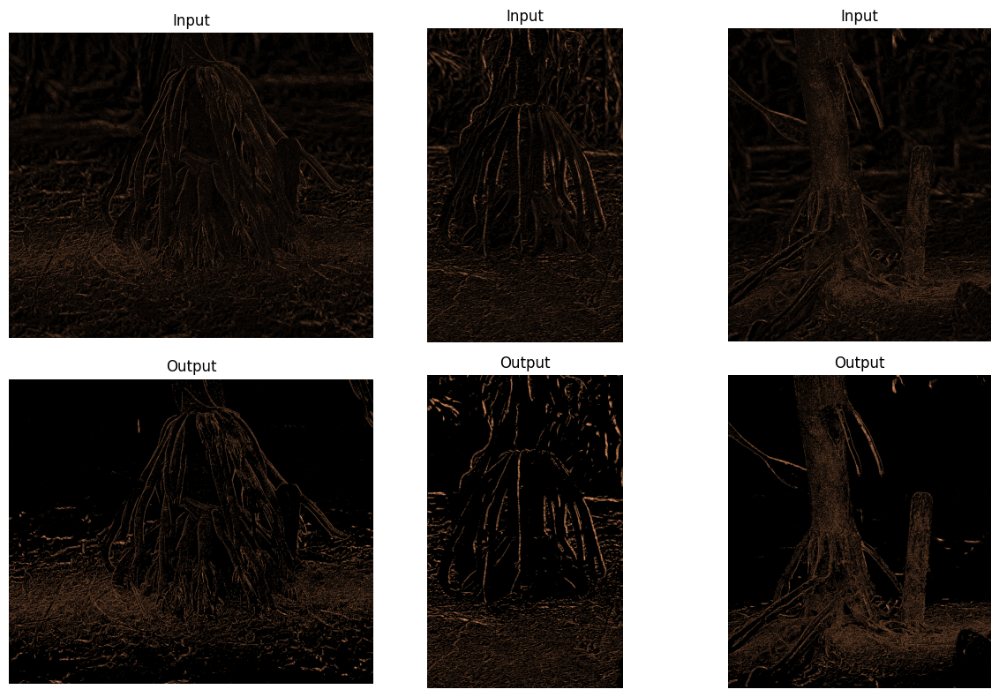

robert_op


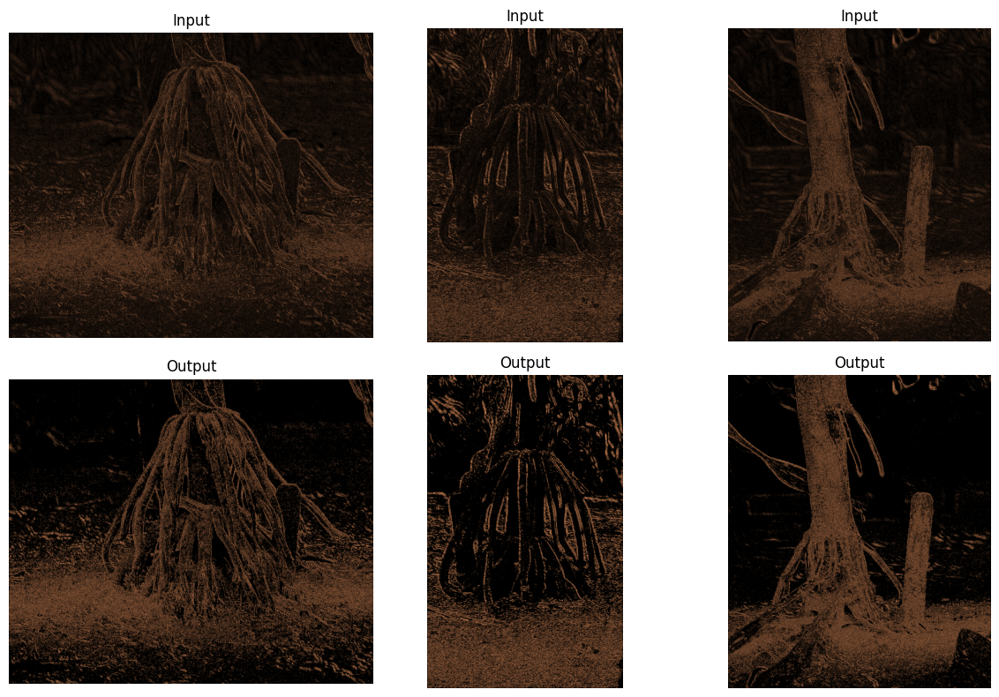

In [14]:
threshd_imgs_2 = []
for i in range(0, len(threshd_imgs), 3):
    print(["sobel_op", "prewitt_op", "robert_op"][i//3])
    for img in threshd_imgs[i:i+3]:
        threshd_imgs_2.append(double_threshold(img, 5,10))
    plot_images(threshd_imgs[i:i+3], threshd_imgs_2[i:i+3])

#### Step 5: Hysteresis

Transform weak pixels to strong pixels if they have strong pixels as neighbors 


In [15]:
def hysteresis(image, weak, strong=255):
    M, N = image.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if image[i, j] == weak:
                try:
                    if ((image[i+1, j-1] == strong) or (image[i+1, j] == strong) or (image[i+1, j+1] == strong)
                        or (image[i, j-1] == strong) or (image[i, j+1] == strong)
                        or (image[i-1, j-1] == strong) or (image[i-1, j] == strong) or (image[i-1, j+1] == strong)):
                        image[i, j] = strong
                    else:
                        image[i, j] = 0
                except IndexError as e:
                    pass
    return image

sobel_op


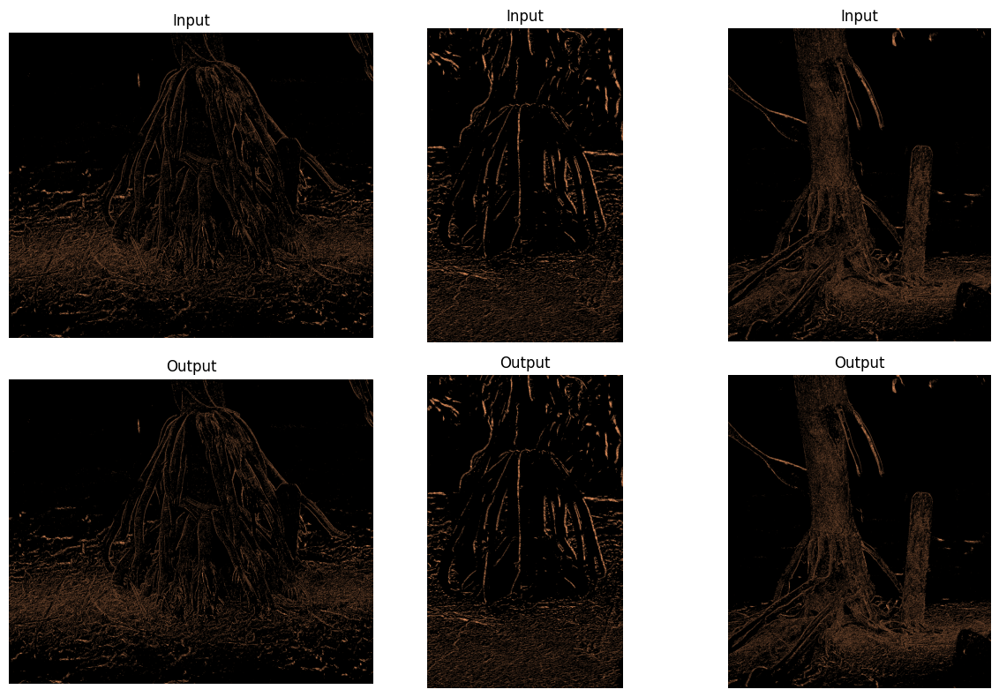

prewitt_op


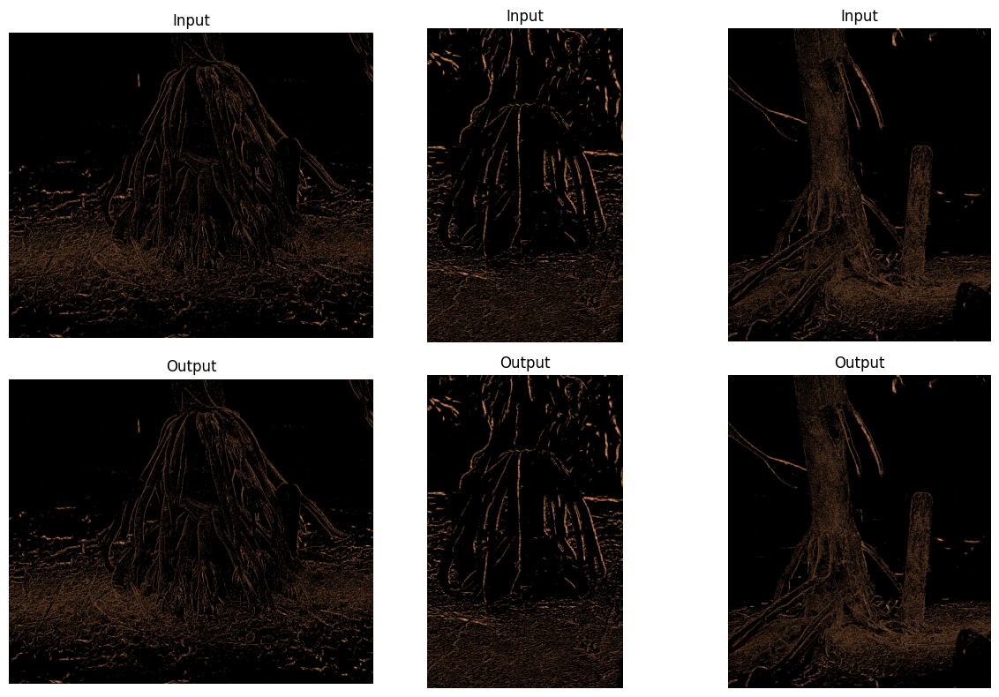

robert_op


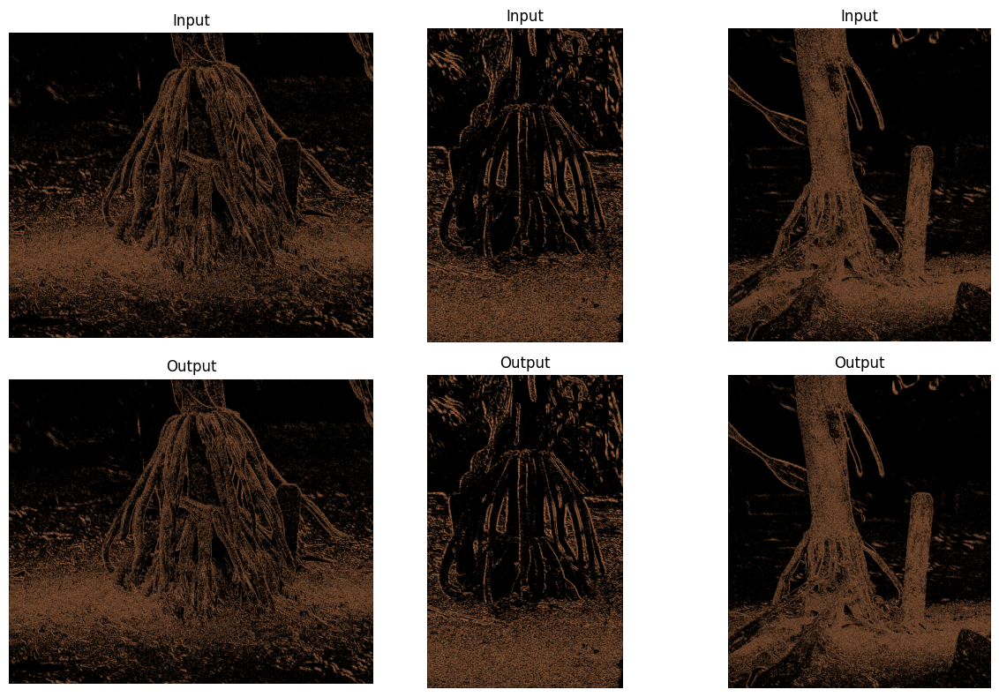

In [16]:
hysterics = []
for i in range(0, len(threshd_imgs_2), 3):
    print(["sobel_op", "prewitt_op", "robert_op"][i//3])
    for img in threshd_imgs_2[i:i+3]:
        hysterics.append(hysteresis(img, 5, 255))
    plot_images(threshd_imgs_2[i:i+3], hysterics[i:i+3])